<a href="https://colab.research.google.com/github/atikhasan007/-Face-Detection-Gradio/blob/main/YOLOv5%20object%20detection%20first.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Feb  2 16:32:20 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   67C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo


Cloning into 'yolov5'...
remote: Enumerating objects: 17783, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 17783 (delta 2), reused 0 (delta 0), pack-reused 17776 (from 2)
Receiving objects: 100% (17783/17783), 16.92 MiB | 17.92 MiB/s, done.
Resolving deltas: 100% (12132/12132), done.


In [3]:
%pwd

'/content'

In [4]:
%cd yolov5

/content/yolov5


In [5]:
%pwd

'/content/yolov5'

In [6]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images

# clear_output()

device_info = (
    torch.cuda.get_device_properties(0) if torch.cuda.is_available() else "CPU"
)

print("Setup complete. Using torch %s on %s" % (torch.__version__, device_info))


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.6/131.6 kB 9.9 MB/s eta 0:00:00
Setup complete. Using torch 2.9.0+cu126 on _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15095MB, multi_processor_count=40, uuid=83e51c2c-7c8d-d02d-60c0-dbc1894bbb42, pci_bus_id=0, pci_device_id=4, pci_domain_id=0, L2_cache_size=4MB)


In [7]:
%cd /content

/content


In [8]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iH4CHk613cpvkxfKvcej")
project = rf.workspace("roboflow-100").project("sign-language-sokdr")
version = project.version(2)
dataset = version.download("yolov5")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 96.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 111.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.90
    Uninstalling opencv-python-headless-4.13.0.90:
      Successfully uninstalled opencv-python-headless-4.13.0.90
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to sign-language-2 in yolov5pytorch:: 100%|██████████| 1452/1452 [00:04<00:00, 354.85it/s]


In [9]:
# Create a folder to extract
!mkdir -p /content/sign-language-2/roboflow_data

# Unzip the file
!unzip -q "/content/sign-language-2/roboflow.zip" -d /content/sign-language-2/roboflow_data

print("Unzip complete!")


unzip:  cannot find or open /content/sign-language-2/roboflow.zip, /content/sign-language-2/roboflow.zip.zip or /content/sign-language-2/roboflow.zip.ZIP.
Unzip complete!


In [10]:
%cat /content/sign-language-2/data.yaml

names:
- A
- B
- C
- D
- E
- F
- G
- H
- I
- J
- K
- L
- M
- N
- O
- P
- Q
- R
- S
- T
- U
- V
- W
- X
- Y
- Z
nc: 26
train: sign-language-2/train/images
val: sign-language-2/valid/images


In [11]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

In [12]:
num_classes

'26'

In [13]:
# this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [14]:
# customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [15]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc:  {num_classes}# number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]


In [17]:
cd /content/yolov5

/content/yolov5


In [18]:
ls


benchmarks.py    data/       LICENSE         README.md         train.py
CITATION.cff     detect.py   models/         README.zh-CN.md   tutorial.ipynb
classify/        export.py   __pycache__/    requirements.txt  utils/
CONTRIBUTING.md  hubconf.py  pyproject.toml  segment/          val.py


In [19]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc:  {num_classes}# number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]


In [20]:
num_classes

'26'

In [21]:
import yaml

# Load the original data.yaml from Roboflow download location
with open(dataset.location + "/data.yaml", 'r') as stream:
    data_yaml_content = yaml.safe_load(stream)

# Update paths to be absolute within the yolov5 directory
data_yaml_content['train'] = f"{dataset.location}/train/images"
data_yaml_content['val'] = f"{dataset.location}/valid/images"

# Write the updated content to a new data.yaml in the yolov5 directory
output_data_yaml_path = "/content/yolov5/data.yaml"
with open(output_data_yaml_path, 'w') as f:
    yaml.dump(data_yaml_content, f)

print(f"Updated data.yaml written to: {output_data_yaml_path}")

Updated data.yaml written to: /content/yolov5/data.yaml


In [22]:
!mv /content/yolov5/data.yaml /content/yolov5/data/data.yaml
!python train.py --img 416 --batch 16 --epochs 20 --data data/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2026-02-02 16:36:18.863696: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770050178.883521    1430 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770050178.889792    1430 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770050178.904855    1430 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1770050178.904880    1430 computation_placer.cc:177] computation placer already registere

# Evaluate Custom YOLOv5 Deector Performance


Training losses and performance matrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train , in our case, we named this yolov5, results, (if given no name , it defaults to results.txt files can be plotted with from utils.utils import plot results;
plot_result().

In [23]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder 'runs'

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

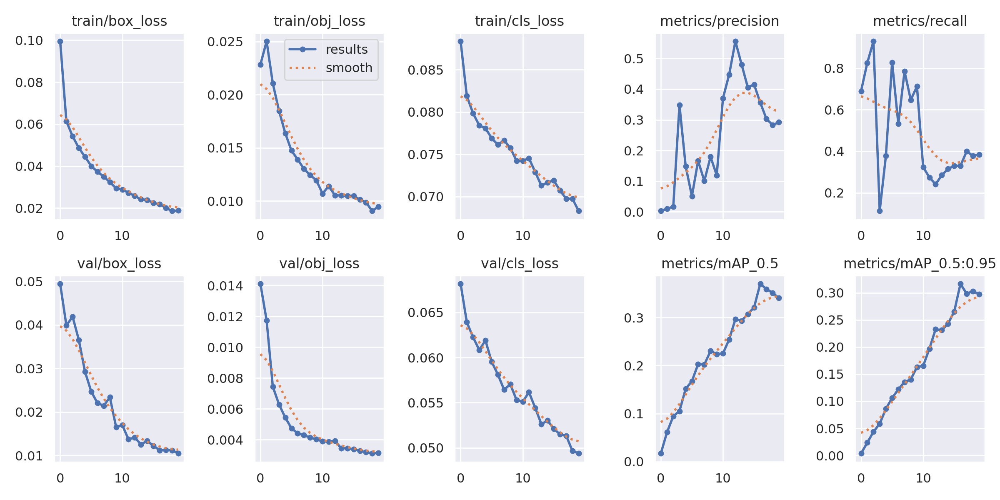

In [25]:
# we can also ouptu some older school graphs if the tensor board isn't
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/results.png')

# Curious? Visualize our training data with labels!

After training begins, inspect the `train.jpg` image to visualize the training images, labels, and applied augmentations.

Note that a mosaic dataloader is used during training (shown below) —  
a novel data loading concept developed by Glenn Jocher and first featured in YOLOv4.


## 🔍 Visualize Training Data with Labels

Once training starts, you can view the generated `train.jpg` file to inspect how the training images, labels, and augmentation effects appear.

This example uses a **mosaic dataloader** —  
a new data loading technique introduced by Glenn Jocher and first implemented in YOLOv4.


GROUND TRUTH TRAINING DATA:


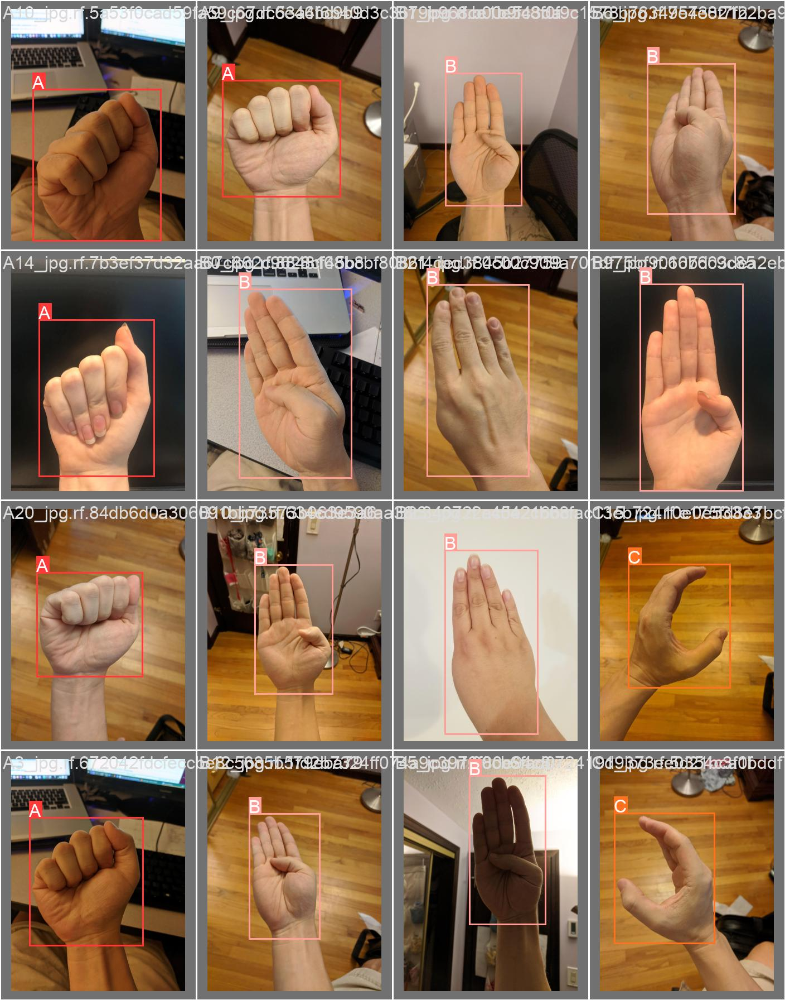

In [30]:
# First, display our ground truth data
from IPython.display import Image, display

print("GROUND TRUTH TRAINING DATA:")
display(Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg'))


GROUND TRUTH AUGMENTED TRAINING DATA : 


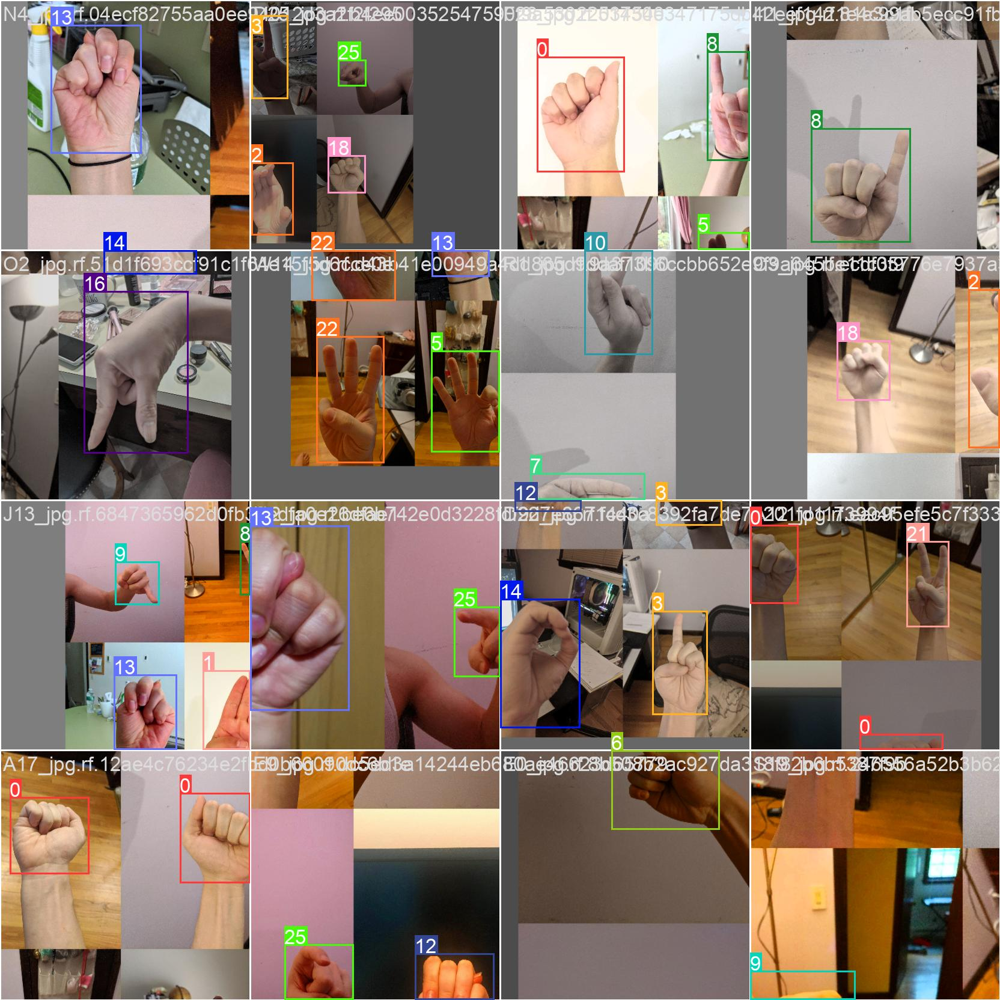

In [31]:
# first , display our ground truth data
print("GROUND TRUTH AUGMENTED TRAINING DATA : ")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg')

In [33]:

# TRAINED WEIGHTS are saved by default in our "runs" folder
# List all runs and their contents
%ls runs/

train/


In [34]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [37]:
!ls /content
!ls /content/yolov5


sample_data  sign-language-2  yolov5
benchmarks.py	 detect.py   __pycache__       runs	       val.py
CITATION.cff	 export.py   pyproject.toml    segment	       wandb
classify	 hubconf.py  README.md	       train.py        yolov5s.pt
CONTRIBUTING.md  LICENSE     README.zh-CN.md   tutorial.ipynb
data		 models      requirements.txt  utils


In [49]:
# Make a flat folder
!mkdir -p /content/sign-language-2/test_flat

# Copy all jpg/png images from subfolders into the flat folder
!find /content/sign-language-2/test/ -type f \( -iname "*.jpg" -o -iname "*.png" \) -exec cp {} /content/sign-language-2/test_flat/ \;


In [50]:
%cd /content/yolov5

!python detect.py \
--weights yolov5s.pt \
--source /content/sign-language-2/test_flat \
--imgsz 416 \
--conf-thres 0.25 \
--project runs/detect \
--name sign_language_results \
--exist-ok


/content/yolov5
detect: weights=['yolov5s.pt'], source=/content/sign-language-2/test_flat, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=sign_language_results, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-457-g84ef1e59 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/72 /content/sign-language-2/test_flat/A22_jpg.rf.66ed75c9e281ec8b549997783c4c216d.jpg: 416x320 1 person, 41.7ms
image 2/72 /content/sign-language-2/test_flat/B14_jpg.rf.85f67b103a1aaef05506af61cb1ef72d.jpg: 416x320 1 person, 6.2ms
image 3/72 /content/sign-language-2/test_flat

# export trained weights for future inference

how that you have trained your custome detector. you can export the trained weights you have made here for inference on you device elsewhare
